# Notes

TripletLoss <anchor, positive, negative>
- positive: not just the same label, but visually similar images => can be from other class 
- negative: 1) from other class, 2) from the same class

**Algorithm to select Triplet <anchor, positive, negative>**

1) use ImageNet21K with original classes to build Triplets 
    - positive - random from the same class 
    - negative - random from other classes 

2) use similarity distance, for each image in `positive_examples`  build 20 triplets 
  -> randomly assign <anchor, positive, negative>
  -> for each <anchor, positive> assign 2 different <negative> 
    

**Algorithm to prepare  `positive_examples`**
- for a new dataset 
- create Voxel51 dataset 
    - select a View for a class/label
    - select a reference image (ancor)
    - sort images by similarity distance (native voxel51, use MobileNet) 
- generate exampels 
- for a a class/label
    - use Voxel51 to visualize examples and update simlarity categories if needed 
    - save updates for label 


In [29]:
import cv2
import fiftyone as fo
import fiftyone.brain as fob
import fiftyone.utils.random as four
from fiftyone import ViewField as F
import numpy as np
import os
from pathlib import Path

from src.utils.config import load_config


## Params

In [30]:
config_path = '../search_index/params.yaml'

config = load_config(config_path)
DATASET_NAME = config.data.dataset_name
DATASET = config.data[DATASET_NAME]
STORAGE = DATASET.data_dir
BASEDIR = config.data.data_base_dir
# BASEDIR = '../data'#config.data.data_base_dir

MODEL_NAME = 'cse'
PATH_EMB_MODEL = '../search_index/models/saved_model.pt'
MODELS_DIR = config.build_index.models_dir
INDEX_PATH = Path('..', MODELS_DIR, f'{DATASET_NAME}__{MODEL_NAME}.index')
print(INDEX_PATH)


config_path = '../search_index/params.yaml'
config = load_config(config_path)

DATASET_NAME = 'food_101_small'  
# DATASET = config.data[DATASET_NAME]

# STORAGE = DATASET.data_dir
STORAGE_PATH = '~/storage/kaggle-guie'
DATASET_PATH = Path(f"{STORAGE_PATH}/{DATASET_NAME}").expanduser()
DATASET_PATH_DATA = Path(STORAGE_PATH, DATASET_NAME, 'data').expanduser()


PATH_EMBEDDINGS_DIR = Path(BASEDIR, DATASET_NAME, "embeddings")
PATH_EMBEDDINGS = Path(PATH_EMBEDDINGS_DIR, "embeddings.parquet")
PATH_EMB_MODEL = Path(config.embeddings.models_dir, config.embeddings.model_name)
BATCH_SIZE = config.embeddings.batch_size

PATH_TEST_DATA_EMBEDDINGS = PATH_EMBEDDINGS
PATH_DATASET_ANNOTATIONS = Path(BASEDIR, DATASET_NAME, "annotations.csv")
# PATH_DATASET_ANNOTATIONS = '../data/food_101_small/annotations.csv'

print(DATASET_PATH)
print(DATASET_PATH_DATA)


INDEX_PATH = Path('..', MODELS_DIR, f'{DATASET_NAME}__{MODEL_NAME}.index')
print(INDEX_PATH)

../models/baseline_split__cse.index
/Users/mnrozhkov/storage/kaggle-guie/food_101_small
/Users/mnrozhkov/storage/kaggle-guie/food_101_small/data
../models/food_101_small__cse.index


In [3]:
PATH_DATASET_ANNOTATIONS

PosixPath('../data/food_101_small/annotations.csv')

# Food data 

### Download dataset to local
Download the datasets you want to test from our Data registry to your local folder and unzip it. Be careful about the revision of the Data registry.

You do not need any credentials to download the files.

Data registry link: https://github.com/iterative/google-kaggle-competition-data-pipeline/tree/pipeline_v2


**Notes**

- [ ] could be helpful have image thumbnails for fast data preview 
- [ ] delete original `.zip` files after unzipping (optional)
- [ ] check if dataset exists and skip downloading by default
- [ ] `lazy` download: load only index files, select/merge by annotation properties, then load only required files (requires loading by filenames, net .zip shards, parallel loading) 


In [31]:
# DATASET_NAME = 'freiburg_groceries' 
DATASET_NAME = 'food_101_small'  

STORAGE_PATH = '/Users/mnrozhkov/storage/kaggle-guie'
DATASET_PATH = f"{STORAGE_PATH}/{DATASET_NAME}"

print(DATASET_PATH)

/Users/mnrozhkov/storage/kaggle-guie/food_101_small


In [6]:
# !dvc get https://github.com/iterative/google-kaggle-competition-data-pipeline datasets/food_101_small -o ../datasets/food_101_small --rev a44271f
# !dvc get https://github.com/iterative/google-kaggle-competition-data-pipeline datasets/freiburg_groceries -o ../datasets/freiburg_groceries --rev a44271f

# !unzip -o ../datasets/food_101_small/food_101_small.zip -d ../datasets/food_101_small/
# !unzip -o ../datasets/freiburg_groceries/freiburg_groceries.zip -d ../datasets/freiburg_groceries/



# !dvc get https://github.com/iterative/google-kaggle-competition-data-pipeline datasets/{DATASET_NAME} -o {DATASET_PATH} --rev a44271f   
# !unzip -o {DATASET_PATH}/{DATASET_NAME}.zip -d {DATASET_PATH}

### Load datasets to Voxel
Load datasets that you want to work with into Voxel51.

In [7]:
# In case, you need to delete the dataset because it was not created properly
# dataset = fo.load_dataset('freiburg_groceries')
# dataset.delete()

In [8]:
def load_dataset(dataset_name, dataset_dir=None):
    if not fo.dataset_exists(dataset_name):
        dataset = fo.Dataset.from_dir(
            dataset_dir=Path(dataset_dir, dataset_name),
            dataset_type=fo.types.FiftyOneImageClassificationDataset,
            name=dataset_name
        )
    else:
        # Loads the FiftyOne dataset with the given name
        dataset = fo.load_dataset(dataset_name)
    return dataset

dataset_food_101_small = load_dataset('food_101_small', dataset_dir=STORAGE_PATH)
# dataset_freiburg_groceries = load_dataset('freiburg_groceries', dataset_dir=STORAGE_PATH)

#### Quick check that everything was loaded properly

In [9]:
print(dataset_food_101_small.count())
print(dataset_food_101_small.count_values('ground_truth.label'))

# print(dataset_freiburg_groceries.count())
# print(dataset_freiburg_groceries.count_values('ground_truth.label'))

10100
{'beef_tartare': 100, 'baklava': 100, 'croque_madame': 100, 'prime_rib': 100, 'ramen': 100, 'deviled_eggs': 100, 'macarons': 100, 'falafel': 100, 'pad_thai': 100, 'chicken_curry': 100, 'fried_calamari': 100, 'pancakes': 100, 'panna_cotta': 100, 'oysters': 100, 'cup_cakes': 100, 'fish_and_chips': 100, 'escargots': 100, 'caesar_salad': 100, 'donuts': 100, 'gyoza': 100, 'huevos_rancheros': 100, 'french_onion_soup': 100, 'beet_salad': 100, 'club_sandwich': 100, 'beignets': 100, 'hamburger': 100, 'spaghetti_carbonara': 100, 'chicken_quesadilla': 100, 'tacos': 100, 'takoyaki': 100, 'greek_salad': 100, 'spring_rolls': 100, 'tuna_tartare': 100, 'eggs_benedict': 100, 'scallops': 100, 'ice_cream': 100, 'sushi': 100, 'foie_gras': 100, 'lasagna': 100, 'edamame': 100, 'bruschetta': 100, 'peking_duck': 100, 'ravioli': 100, 'risotto': 100, 'mussels': 100, 'chocolate_mousse': 100, 'crab_cakes': 100, 'strawberry_shortcake': 100, 'french_toast': 100, 'gnocchi': 100, 'lobster_roll_sandwich': 100, '

### Review dataset


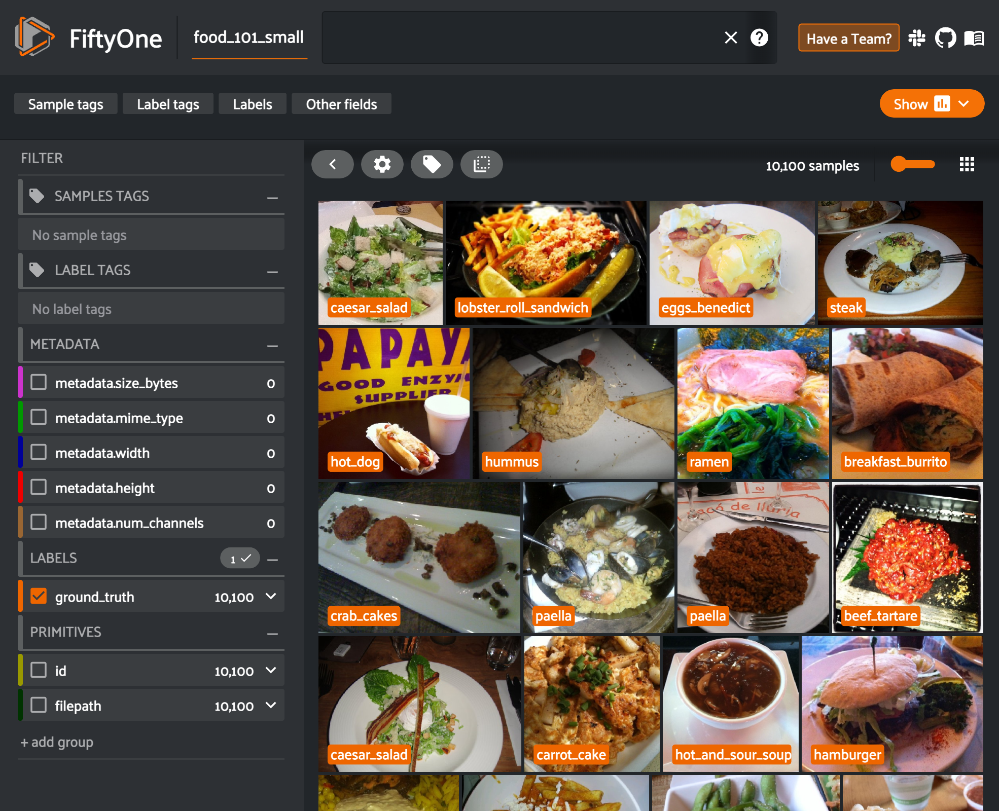

In [19]:
# View results in the App
dataset=dataset_food_101_small

session = fo.launch_app(
    dataset=dataset
)

In [11]:

# session = fo.launch_app(dataset=dataset_freiburg_groceries)

# Prepare dataset annotations 

In [34]:
import argparse
import numpy as np
import os
import pandas as pd
from pathlib import Path
import torch
from torchvision import transforms as T
from torch.utils.data import DataLoader
from tqdm import tqdm
from typing import Text

from src.utils.config import load_config
from search_index.src.utils import CustomImageDataset

from src.utils.config import load_config
from search_index.src.utils import list_all_files


In [35]:
def list_all_files(directory, is_relative=True):
    
    dirpath = Path(directory).expanduser()
    assert dirpath.is_dir()
    
    file_list = []
    for x in dirpath.iterdir():
        
        if x.is_file():
            file_list.append(x.__str__())
        elif x.is_dir():
            file_list.extend(list_all_files(x, is_relative=False))
    
    if is_relative is True:
        file_list = [get_relative_path(path, directory) for path in file_list]
    
    return file_list

def get_relative_path(path, base): 
#     print(path)
    return Path(path).relative_to(base).__str__()

# list_all_files(DATASET_PATH_DATA, is_relative=True)
list_all_files('/Users/mnrozhkov/storage/kaggle-guie/baseline_split', is_relative=True)

['.DS_Store',
 'test/artwork/360.png',
 'test/artwork/638.png',
 'test/artwork/604.png',
 'test/artwork/837.png',
 'test/artwork/770.png',
 'test/artwork/599.png',
 'test/artwork/956.png',
 'test/artwork/942.png',
 'test/artwork/76.png',
 'test/artwork/836.png',
 'test/artwork/405.png',
 'test/artwork/363.png',
 'test/artwork/388.png',
 'test/artwork/161.png',
 'test/artwork/834.png',
 'test/artwork/773.png',
 'test/artwork/564.png',
 'test/artwork/61.png',
 'test/artwork/612.png',
 'test/artwork/148.png',
 'test/artwork/404.png',
 'test/artwork/602.png',
 'test/artwork/164.png',
 'test/artwork/170.png',
 'test/artwork/158.png',
 'test/artwork/825.png',
 'test/artwork/831.png',
 'test/artwork/71.png',
 'test/artwork/776.png',
 'test/artwork/979.png',
 'test/artwork/951.png',
 'test/artwork/548.png',
 'test/artwork/207.png',
 'test/artwork/950.png',
 'test/artwork/987.png',
 'test/artwork/70.png',
 'test/artwork/58.png',
 'test/artwork/826.png',
 'test/artwork/990.png',
 'test/artwork/7

In [43]:
# # # Test get_relative_path

# file = Path('/Users/mnrozhkov/storage/kaggle-guie/food_101_small/data/1000016.jpg')

# print(DATASET_PATH_DATA)
# print(file.relative_to(DATASET_PATH_DATA).__str__())
# print(get_relative_path(file, DATASET_PATH_DATA))

In [44]:
def get_dataset_annotions_from_manifest(data_dir):
    
    import json

    with open(f'{data_dir}/labels.json') as file:
        labels = json.load(file)
    
    with open(f'{data_dir}/manifest.json') as file:
        manifest = json.load(file)
        
    df = pd.DataFrame({
        'label': labels.get('labels'),
        'path':  manifest,
        })
    df['file'] = df.path.apply(get_relative_path, base = data_dir)
    df = df.reset_index().rename(columns={'index': 'id'})

    return df


annotations = get_dataset_annotions_from_manifest(DATASET_PATH)
annotations.to_csv(PATH_DATASET_ANNOTATIONS, index=False)
annotations.head()

,id,label,path,file
0,1000016,caesar_salad,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000016.jpg
1,100009,lobster_roll_sandwich,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/100009.jpg
2,1000104,eggs_benedict,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000104.jpg
3,1000205,steak,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000205.jpg
4,1000288,hot_dog,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000288.jpg


In [45]:
PATH_DATASET_ANNOTATIONS

PosixPath('../data/food_101_small/annotations.csv')

In [ ]:
# # Extract annotations (from dirs structure)

# def get_dataset_annotions_from_dir(data_dir):
#     dirs = [f for f in data_dir.iterdir() if f.is_dir()]
#     print(dirs)
#     frames = []
#     for i, dir in enumerate(dirs):
#         print(dir)
#         paths = list_all_files(dir)
#         frame = pd.DataFrame({
#             'file': paths, 
#             'label': i, 
#             'label_name': dir.relative_to(data_dir).name,
#             })
#         frames.append(frame)

#     # Sample and save annotations
#     annotations = pd.concat(frames, axis=0)
#     return annotations

# annotations = get_dataset_annotions_from_dir(DATASET_PATH_DATA)

# Prepare positive and negative examples 

```
similarity_example = {
     'dataset': None, 
     'label': None,
     'close_positive': [],     # very similar
     'hard_positive': [],      # similar but not as close as 'close_positive'
     'hard_negative': [],      # have some similarity feautures, but would be considered as negative
     'semihard_negative': [],  # very unsimilar from other class
}

```

## Load data

In [54]:
import pandas as pd

# Load annotations
annotations = pd.read_csv(PATH_DATASET_ANNOTATIONS)
annotations.head()

,id,label,path,file
0,1000016,caesar_salad,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000016.jpg
1,100009,lobster_roll_sandwich,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/100009.jpg
2,1000104,eggs_benedict,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000104.jpg
3,1000205,steak,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000205.jpg
4,1000288,hot_dog,/Users/mnrozhkov/storage/kaggle-guie/food_101_...,data/1000288.jpg


## Get IDs for voxel51 dataset
 

In [55]:
def get_dataset_ids(dataset, data_dir):
    # Set of query IDs
    ids = pd.DataFrame({
        'id': dataset.values('id'),
        'file': list(map(lambda f: f.replace(data_dir.as_posix() + '/', ''), dataset.values('filepath')))
    })
    return ids


## Add column id
id = sample.id

In [59]:
ids = get_dataset_ids(dataset_food_101_small, data_dir = Path(DATASET_PATH))
print(ids.head(2))

embeddings_df = pd.merge(left=ids, right=annotations, on='file', suffixes = ('', '_query'),)
embeddings_df.head(3)

                         id              file
0  632b16e955896c7bd097c6ac  data/1000016.jpg
1  632b16e955896c7bd097c6b0   data/100009.jpg


,id,file,id_query,label,path
0,632b16e955896c7bd097c6ac,data/1000016.jpg,1000016,caesar_salad,/Users/mnrozhkov/storage/kaggle-guie/food_101_...
1,632b16e955896c7bd097c6b0,data/100009.jpg,100009,lobster_roll_sandwich,/Users/mnrozhkov/storage/kaggle-guie/food_101_...
2,632b16e955896c7bd097c6b1,data/1000104.jpg,1000104,eggs_benedict,/Users/mnrozhkov/storage/kaggle-guie/food_101_...


## Prepare Sample

In [60]:
label_counts = dataset_food_101_small.count_values('ground_truth.label')
label_counts

{'french_onion_soup': 100,
 'grilled_cheese_sandwich': 100,
 'apple_pie': 100,
 'tiramisu': 100,
 'pancakes': 100,
 'filet_mignon': 100,
 'escargots': 100,
 'baby_back_ribs': 100,
 'miso_soup': 100,
 'club_sandwich': 100,
 'pork_chop': 100,
 'bibimbap': 100,
 'grilled_salmon': 100,
 'pho': 100,
 'clam_chowder': 100,
 'pulled_pork_sandwich': 100,
 'beef_tartare': 100,
 'pizza': 100,
 'hummus': 100,
 'paella': 100,
 'cheesecake': 100,
 'bread_pudding': 100,
 'seaweed_salad': 100,
 'chocolate_cake': 100,
 'nachos': 100,
 'hot_and_sour_soup': 100,
 'shrimp_and_grits': 100,
 'ceviche': 100,
 'chicken_wings': 100,
 'breakfast_burrito': 100,
 'lobster_bisque': 100,
 'spaghetti_bolognese': 100,
 'carrot_cake': 100,
 'churros': 100,
 'cannoli': 100,
 'beef_carpaccio': 100,
 'creme_brulee': 100,
 'onion_rings': 100,
 'poutine': 100,
 'sashimi': 100,
 'guacamole': 100,
 'french_fries': 100,
 'waffles': 100,
 'caprese_salad': 100,
 'cheese_plate': 100,
 'red_velvet_cake': 100,
 'macaroni_and_chees


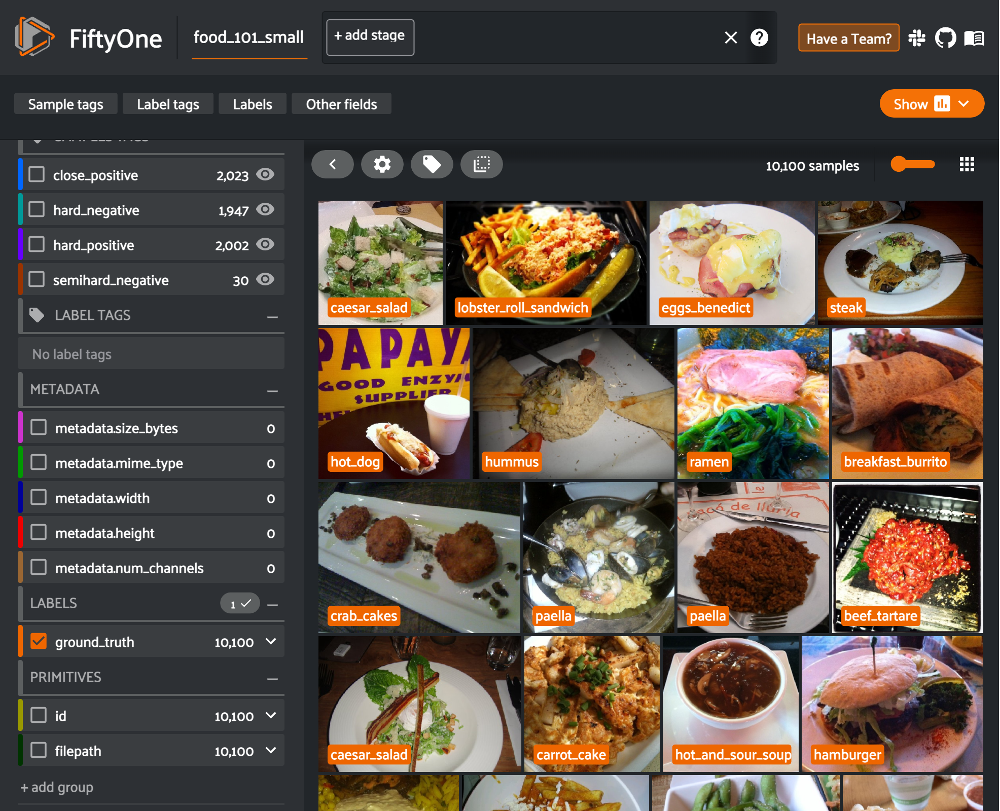


Could not connect session, trying again in 10 seconds



In [53]:
session = fo.launch_app(
    dataset=dataset
)

In [61]:
def get_close_positives(view, n):
    top_n = view.values('id')[:n]
    view_top = view.select(top_n)
#     print(view_top.values('id'))
    return view[view_top].tag_samples('close_positive')

def get_distant_positives(view, n, ):
    half_n = int(n / 2)
    middle = int(len(view) / 2)
    lb = middle - half_n
    ub = middle + half_n

    examples = view.values('id')[lb:ub]
    view_top = view.select(examples)
    view[view_top].tag_samples('distant_positive')
    
def get_close_negative(view, n, ):
    examples = view.values('id')[-n:]
    view_top = view.select(examples)
    view[view_top].tag_samples('close_negative')
    

def id_to_file(dataset, selected_ids): 
    return dataset[dataset.id.isin(selected_ids)]['file'].to_list()

def get_distant_negative_examples(dataset, true_label, n=30): 
    return dataset[dataset.label != true_label].sample(n).file.to_list()
    


In [25]:
# import fiftyone as fo
# import fiftyone.brain as fob

# Select a random query image
# query_id = '632971f016dfd3a02a58f5ee' 
# query_id = dataset.take(1).first().id

# # Index the dataset by image similarity
# fob.compute_similarity(dataset, brain_key="image_sim")

# # Sort the samples by visual similarity to the query image
# view = dataset.sort_by_similarity(query_id, brain_key="image_sim")
# print(view)

    
# get_close_positives(view, 20)
# get_distant_positives(view, 20)
# get_close_negative(view, 20)


# close_positive = id_to_file(dataset = embeddings_df, selected_ids = session.selected)
# print(close_positive)
# print(distant_negative_examples)

In [63]:
import fiftyone as fo
import fiftyone.brain as fob
import json 



for label in label_counts.keys():
    
    LABEL_SAMPLE = label

    SIMILARITY_EXAMPLES_DIR = Path(BASEDIR)/'similarity_examples'
    SIMILARITY_EXAMPLES_PATH = SIMILARITY_EXAMPLES_DIR/f"{DATASET_NAME}__{LABEL_SAMPLE}.json"
    os.makedirs(SIMILARITY_EXAMPLES_DIR, exist_ok=True)

    if not SIMILARITY_EXAMPLES_PATH.is_file():
        
        samples = embeddings_df[embeddings_df.label == LABEL_SAMPLE]['id'].to_list()
        dataset = dataset_food_101_small[samples]
        
        # Select a random query image
        query_id = dataset.take(1).first().id
        
        # Index the dataset by image similarity
        fob.compute_similarity(dataset, brain_key="image_sim")

        # Sort the samples by visual similarity to the query image
        view = dataset.sort_by_similarity(query_id, brain_key="image_sim")
        
        # Set similarity tags based on MobileNet (default)    
        get_close_positives(view, 20)
        get_distant_positives(view, 20)
        get_close_negative(view, 20)
        
        similarity_example = {
            'dataset': None, 
            'label': None,
            'close_positive': [],    # very similar
            'hard_positive': [],     # similar but less than 'close_positive'
            'hard_negative': [],     # have some similarity feautures, but would be considered as negative
            'semihard_negative': [],  # very unsimilar
        }


        # Create a view containing samples with a specific tag
        similarity_example['dataset'] = DATASET_NAME
        similarity_example['label'] = LABEL_SAMPLE

        for tag in ['close_positive', 'hard_positive', 'hard_negative']:
            tag_view = dataset.match_tags(tag)
            selected_ids=tag_view.values('id')
            similarity_example[tag] = id_to_file(dataset=embeddings_df, selected_ids=selected_ids)

        distant_negative_examples = get_distant_negative_examples(embeddings_df, true_label=LABEL_SAMPLE, n=30)
        similarity_example['semihard_negative'] = distant_negative_examples
        
        # Save examples 
        with open(SIMILARITY_EXAMPLES_PATH, 'w') as f:
            json.dump(similarity_example, f)
        print(f'Save similarity examples: {SIMILARITY_EXAMPLES_PATH}')


Computing embeddings...


/Users/mnrozhkov/dev/iterative/rnd/kaggle/google-kaggle-search-index/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/Users/mnrozhkov/dev/iterative/rnd/kaggle/google-kaggle-search-index/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


 100% |█████████████████| 100/100 [12.3s elapsed, 0s remaining, 8.1 samples/s]      
Generating index...
Index complete
Save similarity examples: ../data/similarity_examples/food_101_small__french_onion_soup.json
Computing embeddings...
   1% ||----------------|   1/100 [85.9ms elapsed, 8.5s remaining, 11.6 samples/s] 

/Users/mnrozhkov/dev/iterative/rnd/kaggle/google-kaggle-search-index/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
/Users/mnrozhkov/dev/iterative/rnd/kaggle/google-kaggle-search-index/.venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


  83% |██████████████\--|  83/100 [10.8s elapsed, 2.5s remaining, 6.6 samples/s]    


KeyboardInterrupt: 

## OUTDATED: Rename examples fields (skip)


In [36]:
# from tqdm import tqdm 
# from search_index.src.utils import list_all_files


# SIMILARITY_EXAMPLES_DIR = Path(BASEDIR)/'similarity_examples'

# examples = list_all_files(SIMILARITY_EXAMPLES_DIR, is_relative=False)
# examples

# for file in tqdm(examples):
#     with open(file, 'r') as f:
#         similarity_example = json.load(f)
        
#     keys = similarity_example.keys()
#     if 'distant_positive' in keys:
#         similarity_example['hard_positive'] = similarity_example.pop('distant_positive')
        
#     if 'close_negative' in keys:
#         similarity_example['hard_negative'] = similarity_example.pop('close_negative')
    
#     if 'distant_negative' in keys:
#         similarity_example['semihard_negative'] = similarity_example.pop('distant_negative')

#     similarity_example['easy_negative'] = [] # random from other datasets

#     # Save examples 
#     with open(file, 'w') as f:
#         json.dump(similarity_example, f)
#     print(f'Save similarity examples: {file}')



# Preview examples

In [66]:
def set_similarity_tag(dataset, similarity_examples, dataset_dir, tag='close_positive'):
    
    filepaths = []
    
    if tag in ['close_positive', 'hard_positive', 'hard_negative', 'semihard_negative', 'easy_negative']:

        rel_paths = similarity_example.get(tag)
#         print(rel_paths)
        
        for file in rel_paths:
            filepaths.append(f"{DATASET_PATH}/{file}")
        
        tag_view = dataset.select_by('filepath', filepaths)
        dataset[tag_view].tag_samples(tag)
        
    return dataset

## Add tags to Voxel51 dataset

- parse tags from `similarity_exampl.json` 

In [67]:
import json
from tqdm import tqdm 
from search_index.src.utils import list_all_files

dataset = dataset_food_101_small

SIMILARITY_EXAMPLES_DIR = Path(BASEDIR)/'similarity_examples'
examples = list_all_files(SIMILARITY_EXAMPLES_DIR, is_relative=False)

for file in tqdm(examples):
#     print(file)
    with open(file, 'r') as f:
        similarity_example = json.load(f)
        
    EXAMPLES_DATASET_NAME = similarity_example.get('dataset')
    EXAMPLES_LABEL = similarity_example.get('label')

    set_similarity_tag(dataset, similarity_example, DATASET_PATH, tag='close_positive')
    set_similarity_tag(dataset, similarity_example, DATASET_PATH, tag='hard_positive')
    set_similarity_tag(dataset, similarity_example, DATASET_PATH, tag='hard_negative')
#     set_similarity_tag(dataset, similarity_example, DATASET_PATH, tag='semihard_negative')
#     set_similarity_tag(dataset, similarity_example, DATASET_PATH, tag='easy_negative')


100%|█████████████████████████████████████████████| 1/1 [00:00<00:00, 49.84it/s]


## Visualize tags for `EXAMPLES_LABEL`

In [70]:
# Show all labels in `.json` files

labels = [ex.split('__')[1].split('.json')[0] for ex in examples]
labels.sort(reverse=True)
labels

['french_onion_soup']

In [ ]:
# Show  a view for 
EXAMPLES_LABEL = 'french_onion_soup'

# View results in the App
session = fo.launch_app(
    dataset=dataset.select_by('ground_truth.label', EXAMPLES_LABEL)
)


# session.close()
# del dataset

In [28]:
# dataset.delete()

## Review/Update tags in UI

- [ ] Check `close_positive` tag -> remove/re-tag images that doesn't look like anchor (others)
- [ ] Do the same for `hard_positive` and `hard_negative` 

Note 
- `hard_negative` can be from the same class, but look different 
- you may need few iterations to get good split 
- Voxel51 doesn't save your re-tagging results automatically -> need to get updates and save them manually (see below) 


## Save updates `similarity_examples.json` 

In [ ]:
print(EXAMPLES_LABEL)

SIMILARITY_EXAMPLES_DIR = Path(BASEDIR)/'similarity_examples'
SIMILARITY_EXAMPLES_PATH = SIMILARITY_EXAMPLES_DIR/f"{DATASET_NAME}__{EXAMPLES_LABEL}.json"
print(SIMILARITY_EXAMPLES_PATH)

REVIEWED_SIMILARITY_EXAMPLES_DIR = Path(BASEDIR)/'similarity_examples_reviewed'
os.makedirs(REVIEWED_SIMILARITY_EXAMPLES_DIR, exist_ok=True)
REVIEWED_SIMILARITY_EXAMPLES_PATH = REVIEWED_SIMILARITY_EXAMPLES_DIR/f"{DATASET_NAME}__{EXAMPLES_LABEL}.json"


print(REVIEWED_SIMILARITY_EXAMPLES_PATH)

In [ ]:

# SIMILARITY_EXAMPLES_DIR = Path(BASEDIR)/'similarity_examples'
# SIMILARITY_EXAMPLES_PATH = SIMILARITY_EXAMPLES_DIR/f"{DATASET_NAME}__{EXAMPLES_LABEL}.json"
# print(SIMILARITY_EXAMPLES_PATH)

EXAMPLES_LABEL

In [85]:

# Read from original file
with open(SIMILARITY_EXAMPLES_PATH, 'r') as f:
    similarity_example = json.load(f)

# Create a view containing samples with a specific tag
assert similarity_example['dataset'] == DATASET_NAME
assert similarity_example['label'] == EXAMPLES_LABEL

label_view = dataset.select_by('ground_truth.label', EXAMPLES_LABEL)

for tag in ['close_positive', 'hard_positive', 'hard_negative']:
    tag_view = label_view.match_tags(tag)
    print(tag_view.count_sample_tags())
    selected_ids=tag_view.values('id')
    similarity_example[tag] = id_to_file(dataset=embeddings_df, selected_ids=selected_ids)

# Save to REVIEWED examples 
with open(REVIEWED_SIMILARITY_EXAMPLES_PATH, 'w') as f:
    json.dump(similarity_example, f)
print(f'Save similarity examples: {REVIEWED_SIMILARITY_EXAMPLES_PATH}')


{'close_positive': 33, 'semihard_negative': 1, 'hard_positive': 4, 'close_negative': 1, 'distant_positive': 4}
{'distant_positive': 4, 'close_negative': 2, 'hard_positive': 20, 'close_positive': 4}
{'hard_negative': 20, 'close_negative': 10, 'distant_positive': 2}
Save similarity examples: ../data/similarity_examples_reviewed/food_101_small__french_onion_soup.json


In [84]:
for key in ['close_positive', 'hard_positive', 'hard_negative', 'semihard_negative']:
    print(f"{key}: {len(similarity_example.get(key))}")

close_positive: 33
hard_positive: 20
hard_negative: 20
semihard_negative: 30



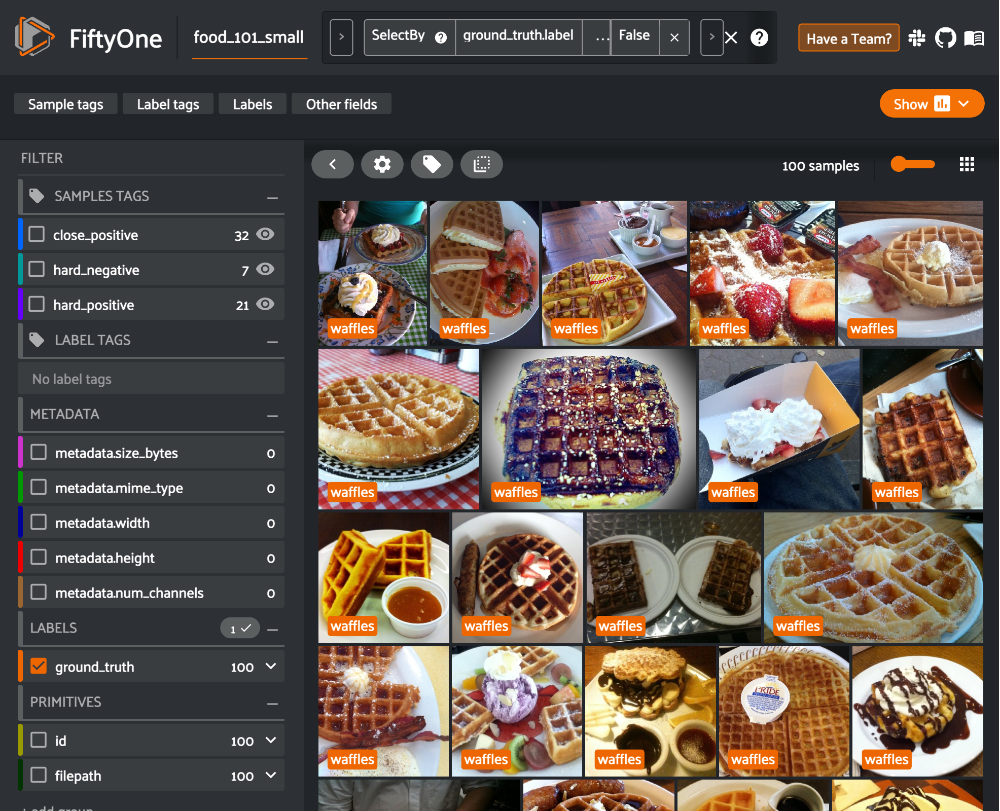


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds



In [69]:
# View results in the App
session = fo.launch_app(
    dataset=dataset.select_by('ground_truth.label', EXAMPLES_LABEL)
)

In [38]:
session.view = view


Could not connect session, trying again in 10 seconds


Could not connect session, trying again in 10 seconds



In [86]:
# # Visualize a custom file 

# from IPython.display import Image, display
# from ipywidgets import widgets, HBox, VBox
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg


# for file in filepaths:
#     display(Image(file))